In [5]:
using FFTW

In [6]:
using Statistics

In [7]:
using ComputationalHeatTransfer
using LaTeXStrings
using Revise
using LinearAlgebra
using DifferentialEquations
using Interpolations
using JLD2


cd(dirname(pwd()))
cd("src") 
includet("OneDOHP.jl")
using ..OneDOHP

In [8]:
using Plots
gr() 

Plots.GRBackend()

## Control Console

In [9]:
fluid_type = "butane"
Tᵥ = 291.2

ΔTthres = 0.5
δfilm = 5e-6
plate_d = 2e-3;
hc = 3000.0

3000.0

# Properies

### Earth property

In [10]:
gravity = 9.8

9.8

### Solid Physical parameters

In [11]:
ρₛ = 2730; # density
# cₛ  = 8.97e02; # specific heat
cₛ  = 8.93e02; # specific heat
# kₛ  = 1.67e02; # heat conductivity
kₛ  = 1.93e02; # heat conductivity
# d = 2e-3;
# plate_d = 1.5e-3;  # plate thickness
params = HeatConductionParameters(ρₛ ,cₛ ,kₛ ,thickness=plate_d)

HeatConductionParameters(2730.0, 893.0, 193.0, 7.916682048820907e-5, 0.002)

### Fluid Physical parameters

In [12]:
# fluid_type = "butane"
# Tᵥ = 291.2

In [13]:
Cpₗ = CoolProp.PropsSI("CPMASS","T",Tᵥ,"Q",0.0,fluid_type)
ρₗ  = CoolProp.PropsSI("D","T",Tᵥ,"Q",0.0,fluid_type)
μₗ  = CoolProp.PropsSI("V","T",Tᵥ,"Q",0.0,fluid_type)
hₗ = CoolProp.PropsSI("H","T",Tᵥ,"Q",0.0,fluid_type)
kₗ = CoolProp.PropsSI("CONDUCTIVITY","T",Tᵥ,"Q",0.0,fluid_type)
Prₗ = CoolProp.PropsSI("PRANDTL","T",Tᵥ,"Q",0.0,fluid_type)

Cpᵥ = CoolProp.PropsSI("CPMASS","T",Tᵥ,"Q",1.0,fluid_type)
ρᵥ  = CoolProp.PropsSI("D","T",Tᵥ,"Q",1.0,fluid_type)
μᵥ  = CoolProp.PropsSI("V","T",Tᵥ,"Q",1.0,fluid_type);
hᵥ = CoolProp.PropsSI("H","T",Tᵥ,"Q",1.0,fluid_type)
kᵥ = CoolProp.PropsSI("CONDUCTIVITY","T",Tᵥ,"Q",1.0,fluid_type)
Prᵥ = CoolProp.PropsSI("PRANDTL","T",Tᵥ,"Q",1.0,fluid_type)

σ = CoolProp.PropsSI("I","T",Tᵥ,"Q",0.0,fluid_type)
P = CoolProp.PropsSI("P","T",Tᵥ,"Q",0.0,fluid_type)
R = CoolProp.PropsSI("GAS_CONSTANT","T",Tᵥ,"Q",1.0,fluid_type)
M = CoolProp.PropsSI("M","T",Tᵥ,"Q",1.0,fluid_type)
Rkg = R/M

αₗ = kₗ/ρₗ/Cpₗ
νₗ = μₗ/ρₗ
νᵥ = μᵥ/ρᵥ;
hₗᵥ = hᵥ-hₗ;

# Plate Conduction

### Geometry parameters

In [14]:
Lx = 0.1524; # plate size x
Ly = 0.0648; # plate size y

In [15]:
xlim = (-Lx/2,Lx/2) .*1.0
ylim = (-Ly/2,Ly/2) .*1.0
Δx, Δt = setstepsizes(params.α,gridPe=8.0,fourier=0.3)


(0.0006333345639056725, 0.001520002953373614)

### Set up the evaporator and condenser

In [16]:
inch = 2.54e-2;

In [17]:
power = 30 #watts
total_heater_area = 2.0inch*2.0inch;

In [18]:
qe = power/total_heater_area
# hc = 1500.0*1.5
# hc = 4000.0
Tc = Tᵥ

291.2

In [19]:
eb1 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Tfe = RigidTransform((0.7inch,-0.0),0.0)
Tfe(eb1)

eb2 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Tfe = RigidTransform((-0.7inch,-0.0),0.0)
Tfe(eb2)

cb1 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tfc = RigidTransform((-2.5inch,-0.0),0.0)
Tfc(cb1)

cb2 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tfc = RigidTransform((2.5inch,-0.0),0.0)
Tfc(cb2)

eparams1 = PrescribedHeatFluxRegion(qe,eb1);
eparams2 = PrescribedHeatFluxRegion(qe,eb2);
# cparams1 = PrescribedHeatModelRegion(hc,Tc,cb1);
cparams2 = PrescribedHeatModelRegion(hc,Tc,cb2);

### Set up the OHP

In [20]:
ds = 1.5Δx
nturn = 16
width_ohp = 46.25*1e-3
length_ohp = 133.83*1e-3
gap = 1e-3
pitch = width_ohp/(2*nturn+1)
x0, y0 = length_ohp/2, width_ohp/2

x, y, xf, yf = ComputationalHeatTransfer.construct_ohp_curve(nturn,pitch,length_ohp,gap,ds,x0,y0,false,false,3pi/2)
# one_loop_gap = 1e-2
# x, y, xf, yf = construct_oneloop_curve(0,0,ds,length_ohp,one_loop_gap,pi/2)


ohp = BasicBody(x,y)

Basic pointwise-specified body with 4877 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0


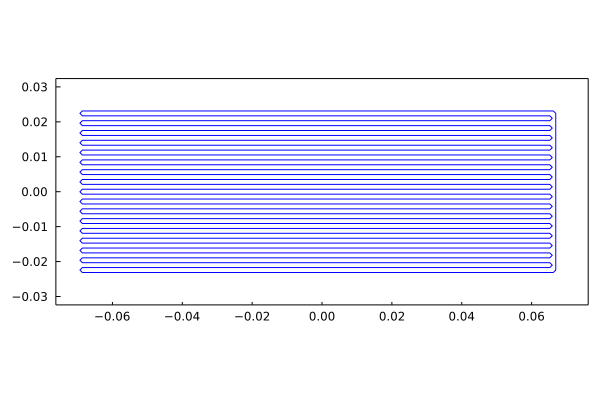

In [21]:
plot(ohp,fillalpha=0,linecolor=:blue,xlims=xlim,ylims=ylim,framestyle = :box)

In [22]:
ohpgeom = ComputationalHeatTransfer.LineSourceParams(ohp)

LineSourceParams{BasicBody{4877, RigidBodyTools.ClosedBody}}(Basic pointwise-specified body with 4877 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0
)

### Create the system

In [23]:
sys = HeatConduction(params,Δx,xlim,ylim,Δt,qline=ohpgeom,qflux=[eparams1,eparams2],qmodel=[cparams2])

Unbounded Heat conduction system on a grid of size 250 x 108 and 0 static immersed points


In [24]:
qtmp = zeros(numpts(ohp));

In [25]:
u0 = newstate(sys)
tspan = (0.0,0.1)
integrator = init(u0,tspan,sys);
Tn = temperature(integrator) .+ Tᵥ;

In [26]:
fill!(qtmp,-0.0)
set_linesource_strength!(sys,qtmp)

Unbounded Heat conduction system on a grid of size 250 x 108 and 0 static immersed points


In [27]:
num = 10
ΔN = 10


Thist=[]

@time for i = 1:num
    Tn = ADI_timemarching!(Tn,sys,Δt)
    
    if mod(i,ΔN) == 0
        push!(Thist,deepcopy(Tn))
    end
end

  1.440172 seconds (2.46 M allocations: 256.897 MiB, 2.59% gc time, 91.62% compilation time)


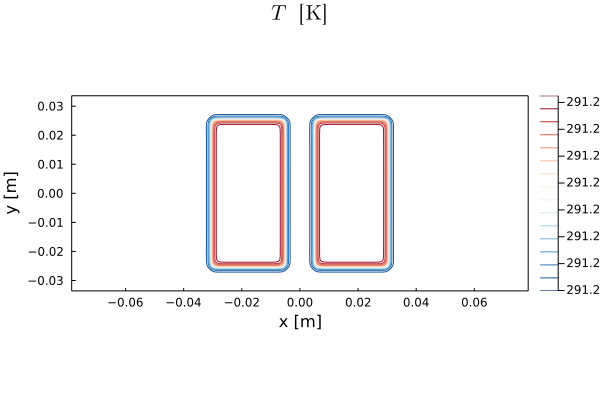

In [28]:
plot(Tn,sys.grid,legend=true,color=cgrad(:RdBu,rev=true),xlabel="x [m]",ylabel="y [m]",title=L"T \quad [\mathrm{K}]")

# OHP inner part

### Tube geometries

In [29]:
tube_d = 1e-3; # tube diameter
peri = 4*tube_d # Tube perimeter
Ac = tube_d*tube_d # tube cross-sectional area
L2D = length_ohp # the actual length of the bended pipe in the real world
L = (sys.qline[1].arccoord[1] + sys.qline[1].arccoord[end])  # total length of the pipe when streched to a 1D pipe (an approximate here)
angle = 0*pi/2 # inclination angle 
closedornot = true

true

In [30]:
tube = Tube(tube_d,peri,Ac,L,L2D,angle,gravity,closedornot);

### Liquid

In [31]:
Nu = 4.36
# Nu = 1.0
Hₗ = kₗ/tube_d * Nu # Nusselt number 4.36

469.1572801658907

In [59]:
X0,realratio = randomXp(L,numofslugs=30,chargeratio=0.45)
# X0 = [(L/2,L/2+L2D)]

dXdt0_l = zeros(length(X0))
dXdt0_r = zeros(length(X0))
dXdt0 = map(tuple,dXdt0_l,dXdt0_r);

In [60]:
# construct liquids
N=numpts(ohp)
Xarrays,θarrays = constructXarrays(X0,N,Tᵥ,L);

In [61]:
liquids=Liquid(Hₗ,ρₗ,Cpₗ,αₗ,μₗ,σ,X0,dXdt0,Xarrays,θarrays);

### Vapor

In [77]:
Hᵥ = kᵥ/tube_d * Nu # Nusselt number 4.36

69.29503570524817

In [78]:
P = 0*zeros(length(X0)) .+ TtoP(Tᵥ);
# δ = 0*zeros(length(X0)) .+ 1.0e-5;
δ = 0*zeros(length(X0)) .+ δfilm ;
# δratio = 0*zeros(length(X0)) .+ 0.99;
# δ = 0*zeros(length(X0)) .+ 2.78E-02;
δmin = 5e-6
vapors=Vapor(Hᵥ,kₗ,δmin,P,δ);

### Wall

### nucleate boiling sites

In [79]:
# ΔTthres = 1.0; # superheat threshold

In [80]:
    nucleatenum = 256
#     Xstations = sort(rand(nucleatenum).*L);
    Xstations = LinRange(0.0,L-L/nucleatenum,nucleatenum)
#     boilingΔt = 0.05

256-element LinRange{Float64}:
 0.0,0.0181667,0.0363334,0.0545,…,4.55984,4.578,4.59617,4.61434,4.6325

In [81]:
Xwallarray,θwallarray = constructXarrays(sys.qline[1].arccoord,L,Tᵥ);
θwallarray .= Tᵥ

wall = Wall(ΔTthres,Xstations,Xwallarray,θwallarray);

In [82]:
sys0_nomapping = PHPSystem_nomapping(tube,liquids,vapors,wall);
θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall = sys_interpolation(sys0_nomapping)
mapping = Mapping(θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall);

In [83]:
sys0 = PHPSystem(tube,liquids,vapors,wall,mapping);

### construct state vector U

In [84]:
Lvaporplug = XptoLvaporplug(X0,sys0.tube.L,sys0.tube.closedornot)
M = PtoD(P) .* Lvaporplug .* Ac
# M = P.^(1/γ).* Lvaporplug


u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];

In [85]:
cb_boiling =  DiscreteCallback(boiling_condition,boiling_affect!)
# cb_boiling =  PeriodicCallback(boiling_affect!,0.01*t_to_nondi_t)
cb_vapormerging =  DiscreteCallback(merging_condition,merging_affect!)
cb_liquidmerging = DiscreteCallback(vaporMergingCondition,vaporMergingAffect!)
cb_fixdx =  DiscreteCallback(fixdx_condition,fixdx_affect!)

cbst = CallbackSet(cb_fixdx,cb_boiling,cb_vapormerging,cb_liquidmerging);
# cbst = CallbackSet(cb_boiling,cb_vapormerging,cb_liquidmerging);

# load old data

In [86]:
# integrator_plate = load("plate_OHP_dimensional50D1.0TH1_H2250_platethickness1.5.jld2", "integrator_plate")
# sys = integrator_plate.p

In [87]:
# integrator_tube = load("tube_OHP_dimensional50D1.0TH1_H2250_platethickness1.5.jld2", "integrator_tube")

# # sysfinal = []
# # for i = 1:length(tube_hist)
# #     push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
# # end

In [88]:
# tube_hist = load("tube_vibration.jld2", "tube_hist")

# combine inner tube and plate together

In [89]:
tspan = (0.0, 300.0);
dt_record = tspan[2] /300;
# dt_record = 0.1;

tstep=5e-4

N_iter = 1
# tstep_plate = tstep/N_iter
# dt_record = tstep

1

In [90]:
u0 = newstate(sys)
integrator_plate = init(u0,tspan,sys)
# Tplate = temperature(integrator_plate);
temperature(integrator_plate) .= Tᵥ;

In [91]:
p = sys0
u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];
prob = ODEProblem(ODE_innertube, u, tspan, p)
integrator_tube = init(prob, RK4(),save_everystep=false, dt=tstep, callback=cbst);

## Resume

In [92]:
# integrator_plate = plate_hist[17]

In [93]:
# integrator_tube = tube_hist[17]

## Start

In [94]:
plate_hist = []
tube_hist  = []

currentsys = integrator_tube.p
currentsys = getcurrentsys(integrator_tube.u,currentsys);

currentsys.wall.θarray = temperature_linesource(integrator_plate)
currentsys = getcurrentsys(integrator_tube.u,currentsys)
integrator_tube.p = currentsys
qtmp = sys_to_heatflux(currentsys)
set_linesource_strength!(sys,qtmp);

In [95]:
@time for t in tspan[1]:tstep:tspan[2]
# @time for t in tspan[1]:tstep:tspan[1]    
    # reinitialize the integrator_tube to avoid some mysterious problems
    prob = ODEProblem(ODE_innertube, deepcopy(integrator_tube.u), (integrator_plate.t-tstep,integrator_plate.t), currentsys)
    integrator_tube = init(prob, RK4(), callback=cbst, dt=tstep);
    step!(integrator_tube,tstep,true);
    
    
      for j in 1:N_iter
        currentsys.wall.θarray = temperature_linesource(integrator_plate)
        currentsys = getcurrentsys(integrator_tube.u,currentsys)

        qtmp = sys_to_heatflux(currentsys)
        set_linesource_strength!(sys,qtmp)


     ADI_timemarching!(temperature(integrator_plate),sys,tstep)
    end
    integrator_plate.t += tstep
    

    if (mod(integrator_plate.t,dt_record) < 1e-6) || (mod(-integrator_plate.t,dt_record) < 1e-6)
        push!(plate_hist,deepcopy(integrator_plate)); 
        push!(tube_hist,deepcopy(integrator_tube));
        println(integrator_plate.t)
    end
    
end

Boiled! on 0.45416701648803914 at 0.3000000000000002
Boiled! on 1.0355007975927293 at 0.3000000000000002
Boiled! on 1.1626675622093803 at 0.3000000000000002
Boiled! on 1.3988344107831605 at 0.3000000000000002
Boiled! on 1.544167856059333 at 0.3000000000000002
Boiled! on 1.671334620675984 at 0.3000000000000002
Boiled! on 1.8166680659521566 at 0.3000000000000002
Boiled! on 1.9438348305688078 at 0.3000000000000002
Boiled! on 2.08916827584498 at 0.3000000000000002
Boiled! on 2.2526684017806744 at 0.3000000000000002
Boiled! on 2.761335460247278 at 0.3000000000000002
Boiled! on 2.888502224863929 at 0.3000000000000002
Boiled! on 3.1610024347567527 at 0.3000000000000002
Boiled! on 3.7060028545423997 at 0.3000000000000002
Boiled! on 3.8331696191590505 at 0.3000000000000002
Boiled! on 4.105669829051874 at 0.3000000000000002
Boiled! on 0.5813337811046901 at 0.4000000000000003
Boiled! on 0.8538339909975137 at 0.4000000000000003
Boiled! on 3.324502560692447 at 0.4000000000000003
Boiled! on 4.414503

merged! in10 at 7.348394564958705
merged! in28 at 7.465499999998582
merged! in11 at 7.4934999999985665
Boiled! on 1.7985013852926353 at 7.499999999998563
Boiled! on 3.8331696191590505 at 7.499999999998563
merged! in31 at 7.689499999998458
merged! in26 at 7.861499999998363
Boiled! on 1.2716676461665097 at 7.899999999998341
merged! in25 at 7.978499999998298
7.999999999998286
Boiled! on 2.1073349565045016 at 8.099999999998408
Boiled! on 3.433502644649576 at 8.099999999998408
Boiled! on 0.7448339070403843 at 8.19999999999853
merged! in5 at 8.200968386268967
Boiled! on 3.1610024347567527 at 8.299999999998652
Boiled! on 2.888502224863929 at 8.499999999998897
Boiled! on 3.5606694092662274 at 8.499999999998897
merged! in31 at 8.500935908644129
Boiled! on 0.9083340329760783 at 8.599999999999019
Boiled! on 1.7985013852926353 at 8.599999999999019
Boiled! on 0.34516693253090974 at 8.799999999999264
merged! in16 at 8.815499999999282
merged! in35 at 8.869900356227568
Boiled! on 2.0710015951854586 at

Boiled! on 2.9248355861829722 at 14.900000000006719
merged! in11 at 14.920500000006744
15.00000000000684
Boiled! on 4.142003190370917 at 15.00000000000684
merged! in9 at 15.20350000000709
Boiled! on 3.7060028545423997 at 15.300000000007207
Boiled! on 1.962001511228329 at 15.40000000000733
Boiled! on 4.41450340026374 at 15.40000000000733
merged! in7 at 15.577324084136594
merged! in14 at 15.60440473454162
merged! in20 at 15.645858705136629
merged! in5 at 15.766500000007778
Boiled! on 1.0173341169332077 at 15.90000000000794
16.00000000000806
Boiled! on 2.6160020149711056 at 16.00000000000806
Boiled! on 3.0156689894805804 at 16.500000000006896
Boiled! on 1.8530014272711999 at 16.70000000000643
Boiled! on 1.9801681918878506 at 16.800000000006197
Boiled! on 3.742336215861443 at 16.900000000005964
merged! in22 at 16.93945674034871
merged! in14 at 16.9417694331837
merged! in24 at 16.943500000005862
merged! in12 at 16.963326177747792
17.00000000000573
Boiled! on 4.232836593668525 at 17.00000000

merged! in18 at 29.93249999997559
29.999999999975433
Boiled! on 1.253500965506988 at 29.999999999975433
Boiled! on 4.559836845539913 at 29.999999999975433
merged! in7 at 30.10799999997518
merged! in2 at 30.449394440218292
Boiled! on 1.3988344107831605 at 30.499999999974268
merged! in7 at 30.59136380316796
Boiled! on 3.8513362998185725 at 30.599999999974035
merged! in23 at 30.61279465670459
merged! in20 at 30.62736540602338
merged! in3 at 30.62736540602338
Boiled! on 3.0156689894805804 at 30.6999999999738
merged! in24 at 30.898999999973338
Boiled! on 0.6358338230832549 at 30.899999999973335
Boiled! on 1.3080010074855528 at 30.899999999973335
merged! in23 at 30.931149306337865
30.999999999973102
Boiled! on 1.1445008815498587 at 30.999999999973102
Boiled! on 1.253500965506988 at 30.999999999973102
Boiled! on 0.7630005876999058 at 31.09999999997287
merged! in14 at 31.14199999997277
merged! in9 at 31.192354188725645
Boiled! on 0.45416701648803914 at 31.199999999972636
Boiled! on 3.833169619

Boiled! on 3.1791691154162742 at 47.4000000000443
merged! in29 at 47.64689314585257
Boiled! on 1.9438348305688078 at 47.70000000004573
merged! in45 at 47.73334080724701
Boiled! on 1.0355007975927293 at 47.80000000004621
48.000000000047166
merged! in40 at 48.02650000004729
Boiled! on 1.5805012173783763 at 48.10000000004764
merged! in33 at 48.370356090368915
merged! in2 at 48.38246383499598
merged! in13 at 48.38983535576497
Boiled! on 1.1445008815498587 at 48.400000000049076
Boiled! on 3.0156689894805804 at 48.400000000049076
Boiled! on 3.0701690314591445 at 48.60000000005003
merged! in40 at 48.735484032097375
merged! in2 at 48.74600000005073
Boiled! on 0.36333361319043134 at 48.800000000050986
Boiled! on 0.47233369714756074 at 48.800000000050986
Boiled! on 1.3988344107831605 at 48.800000000050986
Boiled! on 3.0156689894805804 at 48.800000000050986
merged! in43 at 48.806385465465794
merged! in9 at 48.88692457297297
Boiled! on 2.052834914525937 at 48.90000000005146
merged! in17 at 48.9683

Boiled! on 1.7803347046331137 at 60.800000000108284
merged! in47 at 60.803938427266054
merged! in31 at 60.84780755188587
merged! in51 at 60.84980449027489
Boiled! on 0.23616684857378037 at 60.90000000010876
61.00000000010924
merged! in60 at 61.07194238762051
Boiled! on 2.125501637164023 at 61.100000000109716
Boiled! on 1.3988344107831605 at 61.200000000110194
merged! in61 at 61.33781257653731
merged! in52 at 61.36583505325796
Boiled! on 1.671334620675984 at 61.40000000011115
Boiled! on 2.888502224863929 at 61.40000000011115
merged! in37 at 61.471357524964084
merged! in26 at 61.47734818547925
merged! in51 at 61.504696238345666
merged! in46 at 61.5248337442308
Boiled! on 1.3988344107831605 at 61.600000000112104
Boiled! on 1.671334620675984 at 61.600000000112104
Boiled! on 1.1263342008903372 at 61.80000000011306
Boiled! on 3.7060028545423997 at 61.80000000011306
Boiled! on 0.9446673942951215 at 61.900000000113536
Boiled! on 1.2716676461665097 at 61.900000000113536
merged! in50 at 61.95491

72.00000000016176
merged! in51 at 72.03500000016193
Boiled! on 1.9438348305688078 at 72.10000000016224
merged! in43 at 72.12937844752982
Boiled! on 1.3988344107831605 at 72.20000000016272
merged! in5 at 72.43550000016384
Boiled! on 1.4533344527617253 at 72.50000000016415
Boiled! on 4.014836425754266 at 72.50000000016415
Boiled! on 4.232836593668525 at 72.599995373448
merged! in52 at 72.8054495639253
Boiled! on 0.36333361319043134 at 72.90000000016606
Boiled! on 3.5970027705852705 at 72.90000000016606
merged! in8 at 72.96733726706583
merged! in4 at 72.98290277549341
73.00000000016654
Boiled! on 2.9248355861829722 at 73.00000000016654
merged! in24 at 73.00280223079938
merged! in18 at 73.02381889502844
merged! in28 at 73.02579108568828
merged! in7 at 73.02591709114459
merged! in12 at 73.08079888857074
Boiled! on 0.2180001679142588 at 73.10000000016701
merged! in6 at 73.11833195582513
merged! in39 at 73.13776154087118
Boiled! on 0.8538339909975137 at 73.20000000016749
Boiled! on 4.12383650

merged! in2 at 82.16642139162549
merged! in42 at 82.3740000002113
Boiled! on 0.5813337811046901 at 82.40000000021142
merged! in39 at 82.44683689892436
merged! in35 at 82.45833996693977
merged! in22 at 82.88886889307108
merged! in5 at 82.93034215794098
83.00000000021429
Boiled! on 0.5813337811046901 at 83.00000000021429
Boiled! on 1.5260011753998115 at 83.00000000021429
Boiled! on 1.9438348305688078 at 83.00000000021429
Boiled! on 3.033835670140102 at 83.00000000021429
merged! in19 at 83.08300000021468
Boiled! on 0.2180001679142588 at 83.10000000021476
merged! in38 at 83.12085696479085
merged! in11 at 83.13150000021491
merged! in21 at 83.28600000021565
Boiled! on 0.5813337811046901 at 83.30000000021572
Boiled! on 1.671334620675984 at 83.3999960833187
merged! in16 at 83.45150000021644
Boiled! on 0.34516693253090974 at 83.70000000021763
Boiled! on 3.7241695352019213 at 83.90000000021858
84.00000000021906
Boiled! on 1.7803347046331137 at 84.00000000021906
merged! in27 at 84.01743463621456


merged! in21 at 92.00794607109832
Boiled! on 0.2180001679142588 at 92.10000000025774
merged! in34 at 92.12119224801855
merged! in2 at 92.16245841033277
Boiled! on 0.8538339909975137 at 92.20000000025821
Boiled! on 1.8530014272711999 at 92.20000000025821
Boiled! on 3.288169199373404 at 92.20000000025821
Boiled! on 1.671334620675984 at 92.30000000025869
merged! in25 at 92.41339219068128
merged! in8 at 92.54835380784434
Boiled! on 1.3988344107831605 at 92.80000000026108
Boiled! on 1.7076679819950273 at 92.80000000026108
merged! in31 at 92.84843545164341
Boiled! on 3.324502560692447 at 92.90000000026156
93.00000000026203
merged! in2 at 93.05083226063886
merged! in18 at 93.29150000026343
Boiled! on 0.1090000839571294 at 93.30000000026347
merged! in29 at 93.4344110760064
merged! in30 at 93.4384498435168
merged! in20 at 93.46849740551116
Boiled! on 0.3270002518713882 at 93.50000000026442
Boiled! on 1.3988344107831605 at 93.50000000026442
Boiled! on 1.4715011334212469 at 93.50000000026442
merg

Boiled! on 3.5606694092662274 at 103.30000000031121
Boiled! on 4.105669829051874 at 103.40000000031169
merged! in6 at 103.8304314981747
Boiled! on 4.105669829051874 at 103.90000000031408
merged! in2 at 103.93950000031427
merged! in23 at 103.96168211765493
104.00000000031456
Boiled! on 0.2180001679142588 at 104.00000000031456
Boiled! on 1.1990009235284236 at 104.00000000031456
Boiled! on 3.4698360059686193 at 104.00000000031456
merged! in26 at 104.12300000031514
Boiled! on 1.671334620675984 at 104.20000000031551
Boiled! on 3.615169451244792 at 104.30000000031599
merged! in7 at 104.3463883623171
Boiled! on 4.105669829051874 at 104.40000000031647
merged! in18 at 104.57200000031729
Boiled! on 0.4360003358285176 at 104.60000000031742
Boiled! on 3.578836089925749 at 104.60000000031742
merged! in8 at 104.80740228722152
merged! in22 at 104.87150000031872
Boiled! on 0.5813337811046901 at 104.90000000031885
Boiled! on 1.1263342008903372 at 104.90000000031885
105.00000000031933
merged! in3 at 105

merged! in32 at 116.77400000037555
Boiled! on 0.8720006716570352 at 116.80000000037568
Boiled! on 1.4715011334212469 at 116.80000000037568
117.00000000037663
Boiled! on 3.578836089925749 at 117.10000000037711
Boiled! on 0.39966697450947447 at 117.30000000037806
Boiled! on 0.1635001259356941 at 117.40000000037854
merged! in23 at 117.46800000037886
merged! in2 at 117.4982772135727
merged! in33 at 117.49948133148027
Boiled! on 0.3270002518713882 at 117.50000000037902
Boiled! on 0.7448339070403843 at 117.50000000037902
Boiled! on 3.5970027705852705 at 117.50000000037902
merged! in28 at 117.50779983701118
merged! in10 at 117.52971167236245
Boiled! on 4.014836425754266 at 117.70000000037997
merged! in5 at 117.93450000038109
merged! in22 at 117.9453296880992
118.0000000003814
Boiled! on 1.3988344107831605 at 118.0000000003814
merged! in14 at 118.05085306466133
Boiled! on 4.232836593668525 at 118.10000000038188
Boiled! on 0.2180001679142588 at 118.30000000038284
Boiled! on 1.4715011334212469 a

merged! in16 at 126.0058715269354
merged! in34 at 126.01469854003614
merged! in34 at 126.02033231999911
merged! in28 at 126.02388064717209
merged! in28 at 126.0268634129925
merged! in15 at 126.07436651520688
Boiled! on 1.5623345367188548 at 126.10000000042008
merged! in17 at 126.19650000042054
Boiled! on 1.0355007975927293 at 126.20000000042056
Boiled! on 0.3270002518713882 at 126.40000000042151
Boiled! on 4.014836425754266 at 126.40000000042151
Boiled! on 0.8538339909975137 at 126.70000000042295
merged! in34 at 126.79092220980553
Boiled! on 1.671334620675984 at 126.80000000042342
127.00000000042438
Boiled! on 4.142003190370917 at 127.10000000042486
merged! in10 at 127.11450000042493
Boiled! on 1.3988344107831605 at 127.30000000042581
Boiled! on 3.615169451244792 at 127.30000000042581
merged! in29 at 127.312836131616
Boiled! on 0.5995004617642118 at 127.40000000042629
Boiled! on 1.1263342008903372 at 127.40000000042629
merged! in36 at 127.48885233099647
merged! in19 at 127.623317959839

merged! in19 at 138.20685109605745
Boiled! on 3.4516693253090978 at 138.30000000018558
Boiled! on 0.7448339070403843 at 138.39999641219845
Boiled! on 1.1263342008903372 at 138.50000000018085
merged! in20 at 138.5440000001798
merged! in24 at 138.5754155149525
Boiled! on 1.1263342008903372 at 138.70000000017612
merged! in24 at 138.74688461992363
Boiled! on 4.160169871030439 at 138.9000000001714
merged! in24 at 138.95581606601243
139.00000000016902
Boiled! on 1.1626675622093803 at 139.00000000016902
Boiled! on 3.633336131904313 at 139.00000000016902
merged! in21 at 139.03088499351253
Boiled! on 0.8538339909975137 at 139.10000000016666
merged! in15 at 139.35542599346073
Boiled! on 3.9603363837757013 at 139.39999965002733
merged! in9 at 139.56333179522096
merged! in29 at 139.65289547000216
Boiled! on 0.7630005876999058 at 139.70000000015247
Boiled! on 0.9810007556141646 at 139.70000000015247
Boiled! on 1.1263342008903372 at 139.70000000015247
Boiled! on 1.3988344107831605 at 139.70000000015

merged! in28 at 155.68126384076686
merged! in21 at 155.68479938463102
Boiled! on 3.1791691154162742 at 155.69999999977412
merged! in14 at 155.87643109131116
Boiled! on 1.4715011334212469 at 155.8999999997694
155.99999999976703
Boiled! on 1.7440013433140704 at 156.09999999976466
merged! in13 at 156.28679558460905
merged! in20 at 156.29443356396786
Boiled! on 1.1263342008903372 at 156.59999999975284
Boiled! on 1.3988344107831605 at 156.69999999975047
merged! in31 at 156.81746384325268
Boiled! on 2.2163350404616313 at 156.89999999974575
merged! in28 at 156.93399999974494
merged! in21 at 156.95476518195917
156.99999999974338
Boiled! on 1.671334620675984 at 156.99999999974338
Boiled! on 1.4715011334212469 at 157.09999999974102
Boiled! on 1.9438348305688078 at 157.19999999973865
Boiled! on 1.544167856059333 at 157.2999999997363
Boiled! on 1.7258346626545489 at 157.2999999997363
merged! in13 at 157.33394845506106
merged! in32 at 157.9164999997217
merged! in29 at 157.98587034915033
157.9999999

merged! in21 at 178.12299114661275
merged! in27 at 178.3389228019129
Boiled! on 1.5260011753998115 at 178.39999999923734
Boiled! on 2.125501637164023 at 178.39999999923734
Boiled! on 1.0355007975927293 at 178.79999023821316
178.99999999922315
Boiled! on 1.9801681918878506 at 178.99999999922315
Boiled! on 2.343501805078282 at 178.99999999922315
merged! in23 at 179.23519609903352
merged! in36 at 179.36485655065817
merged! in28 at 179.49685033287477
Boiled! on 1.8530014272711999 at 179.49999999921133
Boiled! on 3.1610024347567527

LoadError: InterruptException:

In [99]:
sysfinal = []
for i = 1:length(tube_hist)
    push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
end

## heat transfer coefficient H in 1D OHP

## get dry out zone

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\AJMX6\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
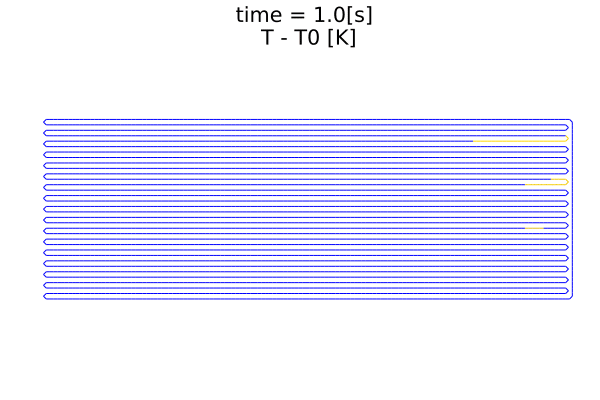

In [79]:
@gif for i=1:1:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=palette([:blue, :gold], 100),line_z=Htmp,xlabel="x ",ylabel="y ",title=string("time = ", round(tube_hist[i].t, digits=2), "[s] \n",  "T - T0 [K]"),border=:none,axis=nothing)
end

In [1]:
Tmax = maximum(temperature(plate_hist[end])[:])
Tmin = minimum(temperature(plate_hist[1])[:])
@gif for i = 1:1:length(plate_hist)
plot(temperature(plate_hist[i]),sys.grid,legend=true,color=cgrad(:RdBu,rev=true),clim=(Tmin,Tmax),line_z=0,xlabel="x [m]",ylabel="y [m]",title=string("time = ", round(plate_hist[i].t, digits=2), "[s] \n",  "T[K]"))
end



LoadError: UndefVarError: plate_hist not defined

In [ ]:
dxIndex = 23
sysfinal[end].liquid.Xarrays[dxIndex][2]-sysfinal[end].liquid.Xarrays[dxIndex][1]

In [ ]:
XptoLliquidslug(sysfinal[end].liquid.Xp,L)
# XptoLvaporplug(sysfinal[7].liquid.Xp,L,true)

In [ ]:
plot(sysfinal[end].vapor.δ)

In [ ]:
i = 42
Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=palette([:red, :gold], 2),line_z=Htmp,xlabel="x ",ylabel="y ",title=string("time = ", round(tube_hist[i].t, digits=2), "[s] \n",  "T - T0 [K], "),clim=(0,300),border=:none,axis=nothing)


In [ ]:
plot(sysfinal[10].vapor.δ)

In [ ]:
sysfinal[7].liquid.Xp

In [ ]:
sysfinal[6].liquid.Xp

In [ ]:
plot(minimum.(sysfinal[end].liquid.dXdt))

In [ ]:
0.2*ρₗ*getδarea(sys0.tube.Ac,sys0.tube.d,1e-5)

In [ ]:
sysfinal[end].liquid.dXdt

In [ ]:
sysfinal[23].vapor.P[21:24]

In [ ]:
sysfinal[end].mapping.H_interp_liquidtowall[0.0]

In [ ]:
plot(0.0:0.001:L,sysfinal[10].mapping.H_interp_liquidtowall[0.0:0.001:L], label="Hvapor[W/m²/K]", xlabel="1D length [m]")

In [ ]:
minimum(sysfinal[end-5].vapor.δ)

In [ ]:
plot(sysfinal[end].vapor.δ,xlabel="vapor label",ylabel="δ")

In [ ]:
minimum(XptoLliquidslug(sysfinal[end].liquid.Xp,L))

In [ ]:
XptoLliquidslug(sysfinal[end].liquid.Xp,L)

In [ ]:
sysfinal[1].liquid.Xp

In [ ]:
minimum(sysfinal[end].liquid.dXdt)

In [ ]:
minimum(XptoLvaporplug(sysfinal[40].liquid.Xp,L,closedornot))

In [ ]:
0.6*5e-4

# plot the OHP

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\AJMX6\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
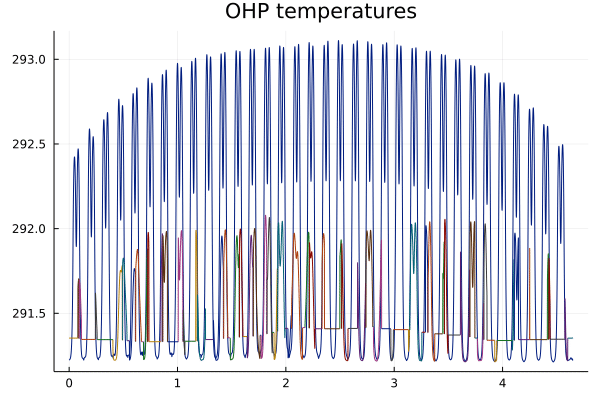

In [129]:
@gif for ii=1:length(sysfinal)
     plot(sysfinal[ii],plottype="T")
end

In [ ]:
plot(sysfinal[10].vapor.δ)

In [ ]:
    δdeposit = 1e-5
    Adeposit = getAdeposit(sys0,δdeposit)

In [ ]:
plot(sysfinal[64],plottype="T",ylim=(291.0,295.0),xlim=(0.0,1.0))

In [ ]:
plot(sysfinal[end-1],plottype="T",ylim=(291.0,302.0),xlim=(4.6,4.66))

In [ ]:
@gif for ii=1:length(sysfinal)
    plot(sysfinal[ii],plottype="T",ylim=(291.0,302.0),xlim=(4.5,5.0))
end

In [ ]:
plot(sysfinal[end-30],plottype="T",ylim=(291.0,292.0),xlim=(0.0,0.5))

In [ ]:
plot(sys.qline[1].arccoord,sys.qline[1].q)

In [ ]:
plot(temperature(plate_hist[end-1]),sys.grid,legend=true,color=cgrad(:RdBu,rev=true),xlabel="x [m]",ylabel="y [m]",title=string("time =  [s] \n",  "T - T0 [K]"))

In [ ]:
Tmax = maximum(temperature(plate_hist[end-1])[:])
Tmin = Tᵥ
@gif for i = 1:1:length(plate_hist)
# @gif     for i = 1:1:1  
    
plot(temperature(plate_hist[i]),sys.grid,legend=true,clim=(Tmin,Tmax),color=cgrad(:RdBu,rev=true),xlabel="x [m]",ylabel="y [m]",title=string("time = ", round(plate_hist[i].t, digits=2), "[s] \n",  "T - T0 [K]"))
end

In [97]:
save("plate_OHP2_30W_conserve_DT0.5_H3000_Film0.5_F1_Nu436_plated_2.jld2", "plate_hist", plate_hist, "integrator_plate", integrator_plate)

In [98]:
save("tube_OHP2_30W_conserve_DT0.5_H3000_Film0.5_F1_Nu436_plated_2.jld2", "tube_hist", tube_hist, "integrator_tube",integrator_tube)

In [ ]:
# plate_hist, integrator_plate = load("plate_OHP_dimensional50D0.3TH1_fixed_new.jld2", "plate_hist",  "integrator_plate")
# sys = integrator_plate.p

In [ ]:
# tube_hist, integrator_tube = load("tube_OHP_dimensional50D0.3TH1_fixed_new.jld2", "tube_hist",  "integrator_tube")

# sysfinal = []
# for i = 1:length(tube_hist)
#     push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
# end

In [75]:
RTDx,RTD1,RTD4 = load("RTD.jld2","RTDx","RTD1","RTD4")

LoadError: ArgumentError: No file exists at given path: RTD.jld2

In [100]:
x = [-2.75inch,-1.4inch,0.0,1.4inch,2.75inch]
y = [0.0,0.0,0.0,0.0,0.0]

X =  VectorData(x,y);

In [101]:
H = Regularize(X,cellsize(sys),I0=origin(sys.grid))
g = ScalarData(X);

In [102]:
ghist = []

size(g)
for j = 1:length(g)
    gtemp = []
    for i = 1:length(plate_hist)
        H(g,temperature(plate_hist[i]))
        append!(gtemp,deepcopy(g[j]))
    end
    push!(ghist,deepcopy(gtemp))
end

In [103]:


thist = []
    for i = 1:length(tube_hist)
        append!(thist,tube_hist[i].t)
    end

In [104]:
# ghist = [Tᵥ;Tᵥ]
# for i = 1:length(plate_hist)
#     H(g,temperature(plate_hist[i]))
# #     println(g)
# #     push!(ghist,deepcopy(g))
#     ghist = hcat(ghist,g)
#     append!(thist,plate_hist[i].t)
# end


In [105]:
ghist

5-element Vector{Any}:
 Any[291.2322579405495, 291.266846171511, 291.32042187360855, 291.5035550436138, 291.7184919364382, 291.99948129147833, 292.2577076209785, 292.59146671835396, 292.8795087582341, 293.2419513133549  …  308.6133025506746, 308.5296918877801, 308.388159544009, 308.26685168791425, 308.17417186223156, 308.1058859514494, 308.04539460962667, 307.97467101324935, 307.8990961423952, 307.79940379837205]
 Any[291.7336209116509, 292.43485813525456, 293.10632565733636, 293.71696856735497, 294.2745850742738, 294.8935561284252, 295.4869352835822, 296.07033907177714, 296.6480461126089, 297.17718445803513  …  308.93901429203083, 308.80244636431854, 308.6172412522413, 308.59196145214503, 308.650718946486, 308.65831837677723, 308.54264140869935, 308.37069321106486, 308.28356682238257, 308.2017679160966]
 Any[292.2812190983432, 293.6020598987689, 294.8102170318863, 295.8081224642635, 296.7212237589789, 297.61321005126973, 298.3939551943856, 299.02687746840377, 299.8337297208416, 300.49

In [106]:
thist[1,:]

1-element Vector{Any}:
 0.9994999999999453

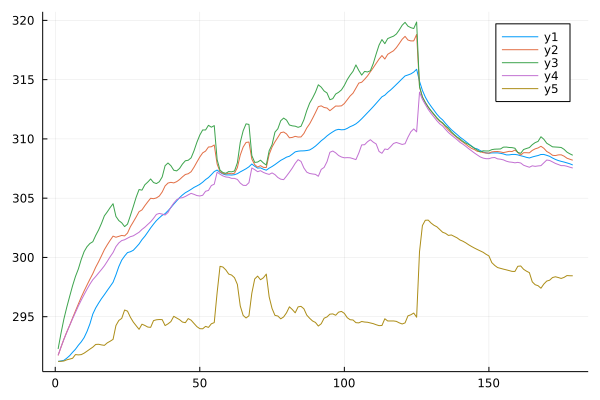

In [107]:
plot(thist,ghist[1])
plot!(thist,ghist[2])
plot!(thist,ghist[3])
plot!(thist,ghist[4])
plot!(thist,ghist[5])
# scatter!(RTDx,RTD4)
# scatter!(RTDx[1:end-1],RTD1[2:end])

In [127]:
sysfinal[end].vapor.δ

46-element Vector{Float64}:
 6.365687589380969e-6
 4.542788939437013e-6
 4.073325564942783e-6
 4.569730587730775e-6
 4.403655102526421e-6
 4.6144767569927815e-6
 4.893589365135646e-6
 4.745798120145516e-6
 5.3054721812793575e-6
 4.874846748270293e-6
 4.935331374778741e-6
 4.931629423721804e-6
 5.887809444490242e-6
 ⋮
 4.878302202637592e-6
 4.944863427163698e-6
 4.846247980152913e-6
 4.714278950679356e-6
 4.957448257121956e-6
 4.9809096942135114e-6
 4.810022122468532e-6
 4.851985459680057e-6
 4.901665980420175e-6
 4.898514275866042e-6
 4.875418044443531e-6
 4.9501668343989096e-6

In [ ]:
Xp_hist = zeros(length(sysfinal))
num = 2
for i = 1:length(sysfinal)
    for j = length(sysfinal[i].liquid.Xp)
#         Xp_hist[i] = sysfinal[i].liquid.Xp[end][end]
        Xp_hist[i] = sysfinal[i].liquid.Xp[1][1]
    end
end

# plot(thist,Xp_hist,label= "FFT of liquid slug interface 1",xlabel="FFT frequency [Hz]")
plot(thist,Xp_hist,label= "FFT of liquid slug interface N",xlabel="time [s]",ylabel="Xp [m]",legend=:topleft)

In [ ]:
dtt = 0.01
fs = 1/dtt

In [ ]:
LL = length(Xp_hist)
Y= fft(Xp_hist .- sum(Xp_hist)./LL )

P2 = abs.(Y/LL);
P1 = P2[1:Int64((LL-1)/2+1)];
P1[2:end-1] = 2*P1[2:end-1];
plot(LinRange(0.0,0.5fs,length(P1)),P1,xlim=(0,20),label= "FFT of liquid slug interface 1",xlabel="FFT frequency [Hz]")

In [ ]:
plot(Xp1_hist)

In [ ]:

velocity_avg = zeros(length(sysfinal))
velocity_max = zeros(length(sysfinal))

for i = 1:length(sysfinal)
    tmp = 0
    for j = length(sysfinal[i].liquid.dXdt)
        tmp += abs(sysfinal[i].liquid.dXdt[j][1])
    
        velocity_avg[i] = tmp/j
    end
    
    velocity_max[i] = maximum(abs.(sysfinal[i].liquid.dXdt[:][1]))
end



In [ ]:
plot(thist,velocity_avg,label="v avg")
plot!(thist,velocity_max,label="v max",xlabel="t [s]", ylabel="v [m/s]")

In [ ]:
d = tube_d
δmin = 5e-3*d

In [ ]:
δmin:1e-6:d/2

In [ ]:
Hfilm

## film H v.s. thickness

In [ ]:
sys0.vapor.δmin

In [ ]:
plot(0.0:1e-8:tube_d/8,Hfilm.(0.0:1e-8:tube_d/8,[sys0]),xlabel="δ[m]",ylabel="h [W/m²/K]")

### Total mass of the system

In [ ]:


thist = []
    for i = 1:length(tube_hist)
        append!(thist,tube_hist[i].t)
    end

In [ ]:
# i = 100
Mass = zeros(length(sysfinal))
M1hist = zeros(length(sysfinal))
M2hist = zeros(length(sysfinal))
M3hist = zeros(length(sysfinal))
for i = 1:length(sysfinal)
    δarea = Ac .* (1 .- ((tube_d .- 2*sysfinal[i].vapor.δ ) ./ tube_d) .^ 2);
    Lvaporplug = XptoLvaporplug(sysfinal[i].liquid.Xp,sysfinal[i].tube.L,sysfinal[i].tube.closedornot)
    Lliquidslug = XptoLliquidslug(sysfinal[i].liquid.Xp,sysfinal[i].tube.L)
    δarea .* Lvaporplug .* ρₗ .+ PtoD.(sysfinal[i].vapor.P) .* (Ac .- δarea) .* Lvaporplug
    M1 = δarea .* Lvaporplug .* ρₗ
    M2 = PtoD.(sysfinal[i].vapor.P) .* (Ac .- δarea) .* Lvaporplug
    M3 = ρₗ .* Ac .* Lliquidslug
    
    Mass[i] = sum(M1+M2)+sum(M3)
    M1hist[i] = sum(M1)
    M2hist[i] = sum(M2)
    M3hist[i] = sum(M3)
#     Mass[i] = sum(M1)
end
# println(sum(M1+M2)+sum(M3))
# println(sum(M1+M2))
# println(sum(M3))
# plot(M3hist/Mass[1])
# subplot(Mass/Mass[1])

In [ ]:
Mass/Mass[1]

In [ ]:
l = @layout [a b ; c d]
p1 = plot(thist,Mass/Mass[1],label = "relative total mass",legend=:bottomright,ylim=(0.99,1.01))
p2 = plot(thist,M1hist/Mass[1],label = "relative film mass",legend=:bottomright)
p3 = plot(thist,M2hist/Mass[1],label = "relative vapor mass",legend=:bottomright)
p4 = plot(thist,M3hist/Mass[1],label = "relative liquid mass")
plot(p1, p2, p3, p4, layout = l)

In [ ]:
@gif for i=1:1:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=palette([:blue, :gold], 100),line_z=Htmp,xlabel="x ",ylabel="y ",title=string("time = ", round(tube_hist[i].t, digits=2), "[s] \n",  "T - T0 [K]"),border=:none,axis=nothing)
end

In [ ]:
@gif for i=1:1:length(sysfinal)
V = [elem[2] for elem in sysfinal[i].liquid.dXdt]
histogram(V,bins=-2:0.1:2,ylim=(0,20),title="hahaha") 
end

In [ ]:
@gif for i=1:1:length(sysfinal)
δs = sysfinal[i].vapor.δ
histogram(δs,bins=3.5e-5:0.25e-6:4.5e-5,ylim=(0,20),title="hahaha") 
end

In [ ]:
Ca_star1 = (μₗ^2/(σ * ρₗ * tube_d/2))^(3/4)

In [ ]:
Ca_star2 = (μₗ^2/(σ * ρₗ * tube_d/2))^(1/2)

In [ ]:
filmδcorr.(Ca,tube_d)

In [ ]:
Ca

In [ ]:
Ca= getCa.(μₗ,σ,sysfinal[end].liquid.dXdt);
maximum(filmδcorr.(Ca,tube_d))

In [ ]:
filmδcorr.(Ca,tube_d)

In [ ]:
Ac

In [ ]:
1.2396099061199528e-7,

In [ ]:
[elem[2] for elem in Adeposit]

In [ ]:
Adeposit[]

In [ ]:
Adeposit = getAdeposit(sysfinal[end])

In [ ]:
typeof((1.0, 2.0))

In [ ]:
Ca[2]

In [ ]:
dXdt[1]

In [ ]:
getδarea.(Ac,tube_d,filmδcorr.(Ca,tube_d))

In [140]:
CSV.write("data.csv", [123 321]])

LoadError: syntax: unexpected "]" in argument list

In [136]:
io = open("myfile.txt", "a");


In [138]:
write(io, "Hello world!");

In [139]:
close(io);